# Computation 

In [1]:
from __future__ import division, print_function, absolute_import

In [2]:
import numpy as np;
import pandas as pd;
import gudhi as gd 
from sklearn import manifold 
from pylab import *
from ripser import ripser, Rips
from persim import plot_diagrams
from matplotlib import pyplot as plt

In [3]:
## GPU computing 
import warnings
#### Numba GPU + CPU Computing ####
import numba as nb
from numba import jit
from numba import njit
from numba import vectorize, float64
from numba import types
from numba.extending import overload_method

In [4]:
import os
import sys
import scipy.io
from itertools import groupby
from Bio import SeqIO

In [5]:
from Time import *

In [7]:
import dask.array as da

In [8]:
pathfile = os.getcwdb()
print(pathfile)

b'c:\\Users\\letph\\Desktop\\MatlabCode\\Python Code'


In [9]:
#change working directory
os.chdir('c:\\Users\\letph\\Desktop\\MatlabCode\\Python Code\\ZCurve')

In [10]:
seqs = [seq for seq in SeqIO.parse(open("Influenza.fasta"), "fasta")]

In [11]:
VirusList = [] 
for i in range(len(seqs)):
    Record = seqs[i]
    TypeName = Record.id
    VirusList.append(TypeName)

# Persistent homology and Persistence diagram 

## Protein binding dataset

In [12]:
## list file txt and sorted them 
files_list = os.listdir()

In [13]:
fileslist = [] 
for file in files_list: 
    if file.endswith('.txt'):
       fileslist.append(file)

In [14]:
fileslist.sort(key=lambda f: int(re.sub('\D', '', f)))

In [15]:
inputs = [np.loadtxt(u, delimiter=',', dtype = 'float64') for u in fileslist] 
#protein0 = gd.RipsComplex(distance_matrix = input, max_edge_length = 0.8)

In [25]:

datas = [] 
append = datas.append
for i in range(len(inputs)):
    arr1 = inputs[i]
    arraydask = da.from_array(arr1,chunks =(1000,3))
    append(arraydask)


## Plotting Persistence Diagrams

In [34]:
## function to get the diagrams with given input: 
"""Input: datalist"""
@overload_method(types.Array, 'repeat')
def DiagListComp(input):
    rips = Rips(maxdim=1, coeff=2)
    DiagramsList = [rips.fit_transform(data) for data in input]
    return DiagramsList

In [36]:
tic()
Diagrams = DiagListComp(inputs)
toc()

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)
Elapsed time: 190.333129 seconds.



In [38]:
Dexample = []
append = Dexample.append
for i in range(2):
    arrays = Diagrams[i]
    append(arrays)

In [150]:
rips = Rips()
    

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


In [173]:
def plotDiagrams(i,k, method = rips):    
    i, k = i,k
    title1 = 'Type ' + str(i)
    title2 = 'Type ' + str(k)
    plt.figure(figsize = (12,6))
    plt.subplot(1,2,1)
    rips.plot(Diagrams[i], show = False)    
    plt.title(title1)
    plt.subplot(1,2,2)
    rips.plot(Diagrams[k], show = False)
    plt.title(title2)
    plt.show()

In [206]:
for i in range(38):
    titlemeaning = 'Type ' + str(i) + '|' + VirusList[i]
    print(titlemeaning)
    print("-----")

Type 0|A/turkey/Ontario/FAV110-4/2009(H1N1)
-----
Type 1|A/mallard/Nova_Scotia/00088/2010(H1N1)
-----
Type 2|A/thick-billed_murre/Canada/1871/2011(H1N1)
-----
Type 3|A/duck/Guangxi/030D/2009(H1N1)
-----
Type 4|A/mallard/France/691/2002(H1N1)
-----
Type 5|A/duck/Hokkaido/w73/2007(H1N1)
-----
Type 6|A/pintail/Miyagi/1472/2008(H1N1)
-----
Type 7|A/mallard/Korea/KNU_YP09/2009(H1N1)
-----
Type 8|A/mallard/Maryland/352/2002(H1N1)
-----
Type 9|A/mallard/Maryland/26/2003(H1N1)
-----
Type 10|A/dunlin/Alaska/44421-660/2008(H1N1)
-----
Type 11|A/mallard/Minnesota/Sg-00620/2008(H1N1)
-----
Type 12|A/turkey/Virginia/4135/2014(H1N1)
-----
Type 13|A/chicken/Eastern_China/XH222/2008(H5N1)
-----
Type 14|A/duck/Eastern_China/JS017/2009(H5N1)
-----
Type 15|A/chicken/Yunnan/chuxiong01/2005(H5N1)
-----
Type 16|A/chicken/Germany/R3234/2007(H5N1)
-----
Type 17|A/domestic_duck/Germany/R1772/2007(H5N1)
-----
Type 18|A/wild_bird/Hong_Kong/07035-1/2011(H5N1)
-----
Type 19|A/Chicken/Hong_Kong/822.1/01_(H5N1)
----

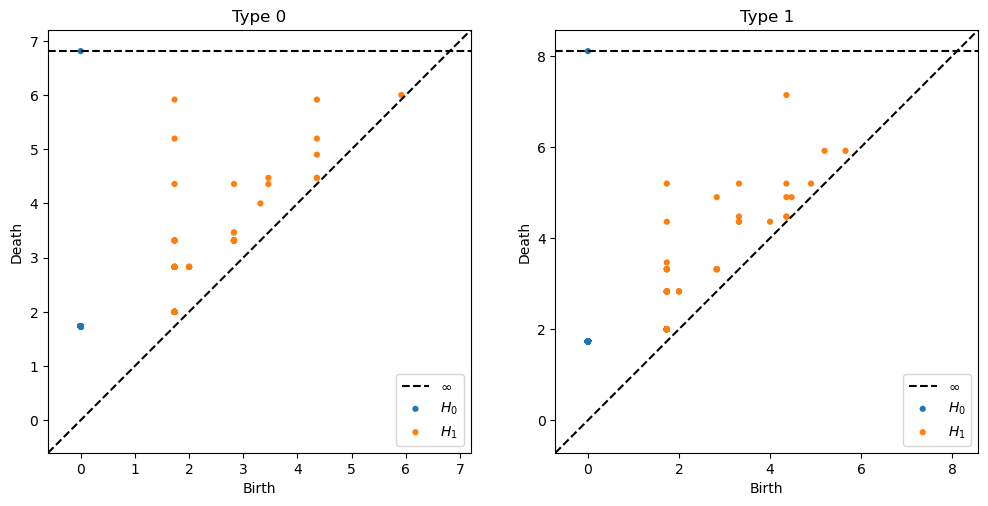

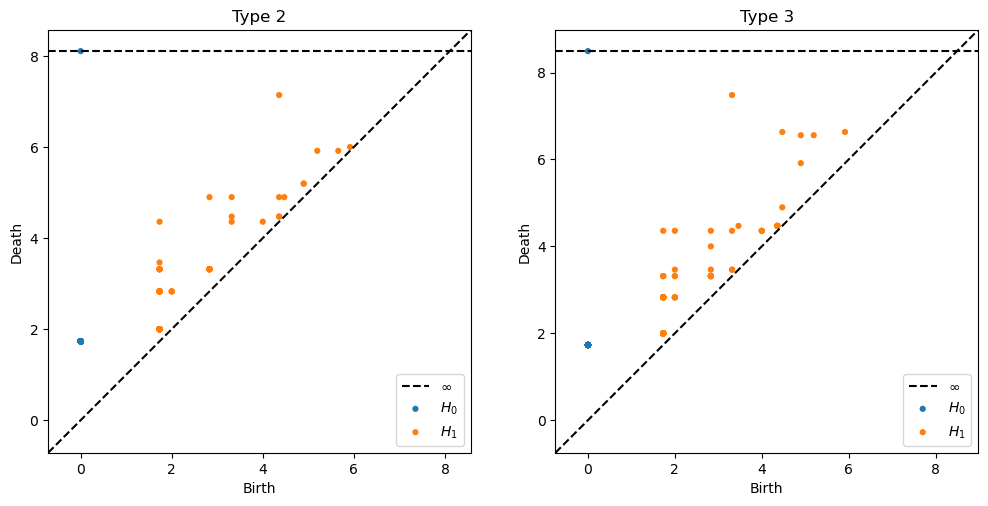

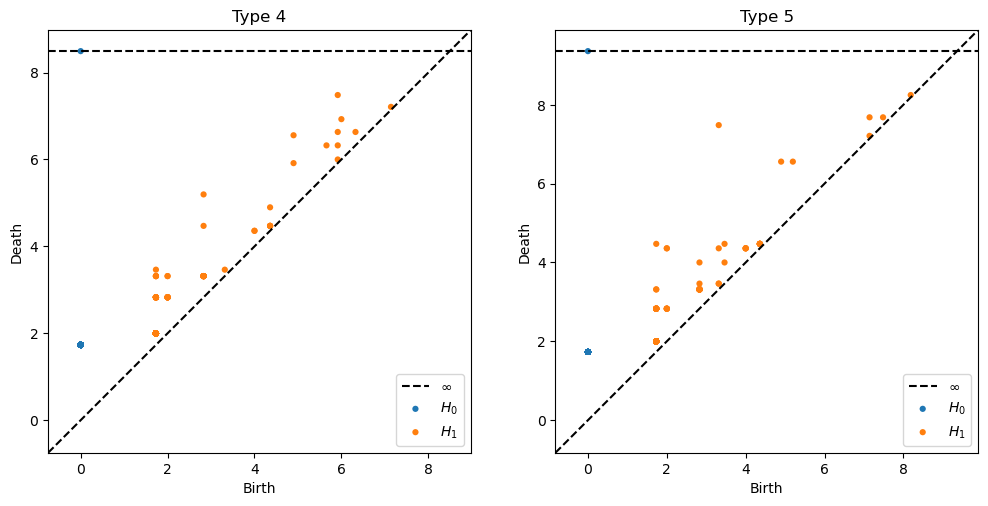

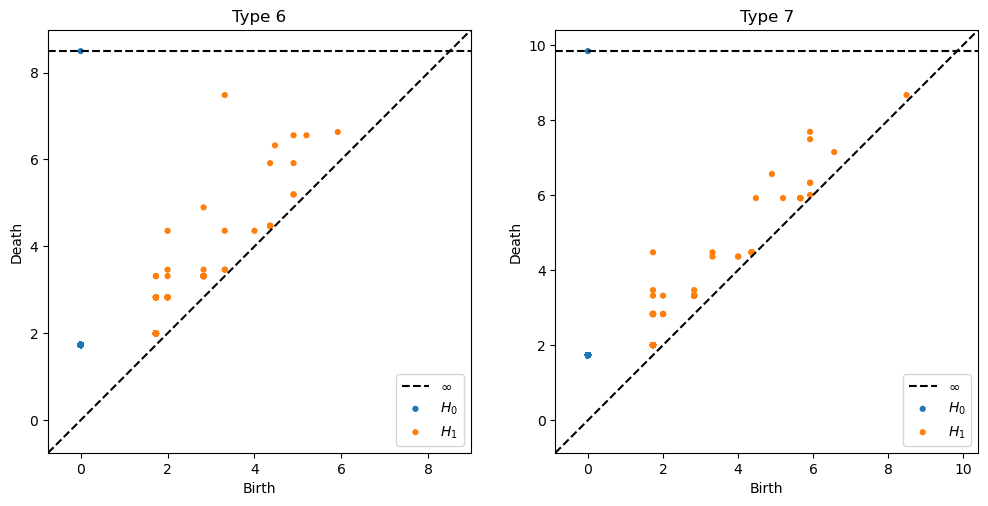

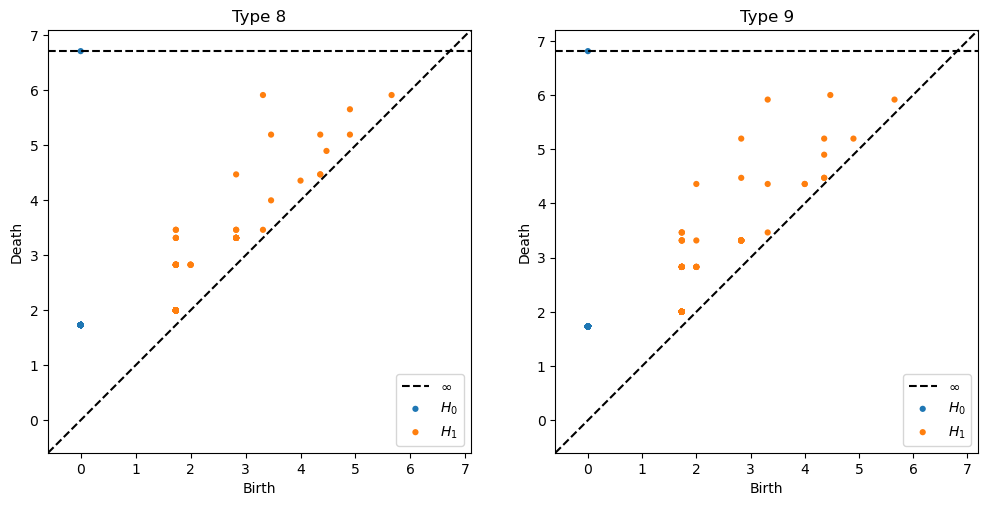

...

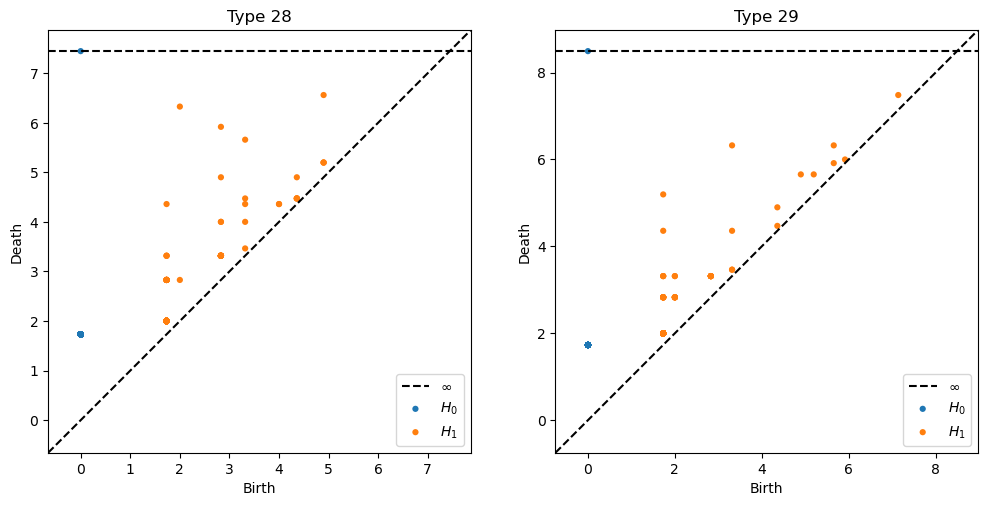

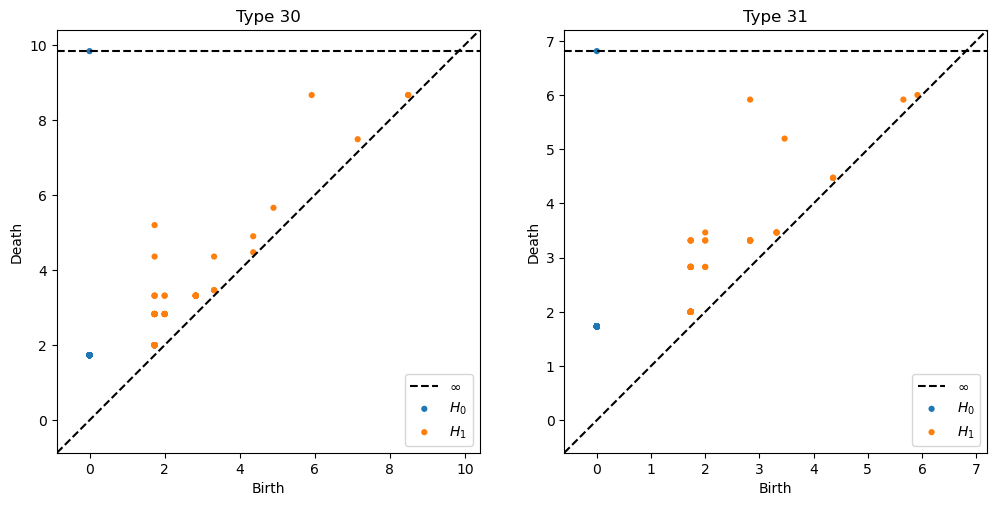

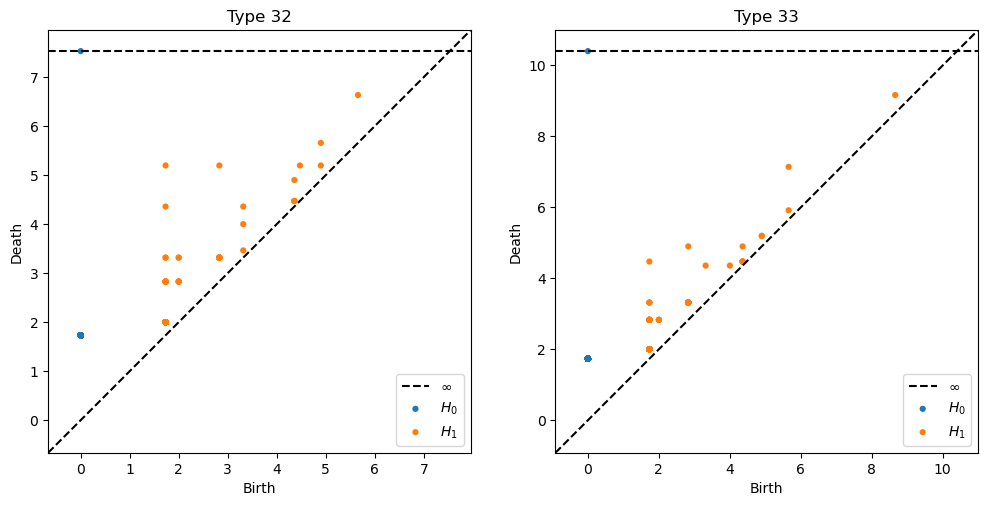

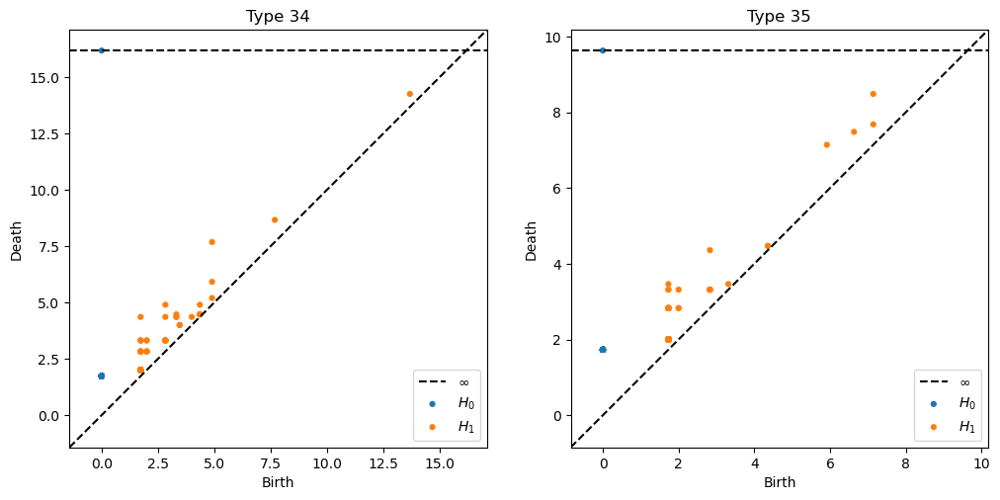

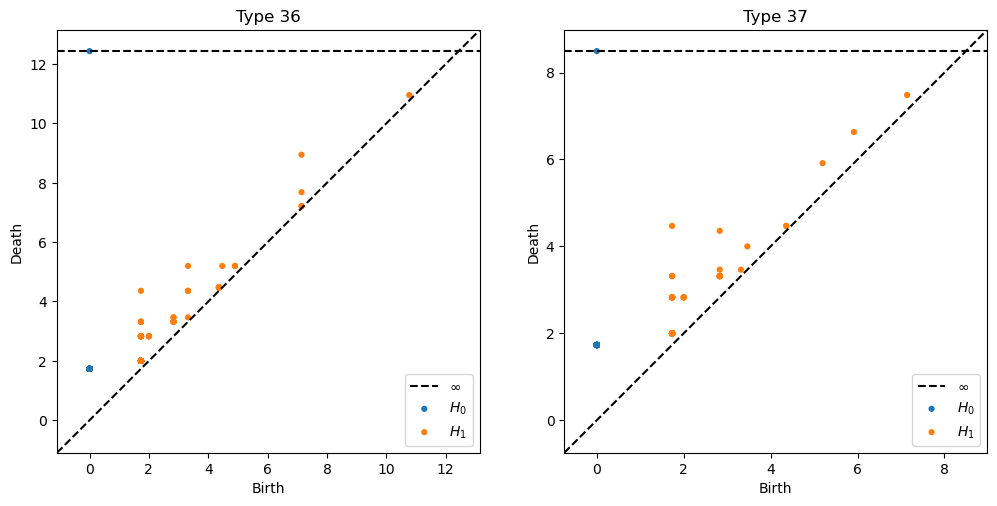

In [186]:
plotDiagrams(0,1,method = rips)
plotDiagrams(2,3,method = rips)

plotDiagrams(4,5,method = rips)
plotDiagrams(6,7,method = rips)

plotDiagrams(8,9,method = rips)
plotDiagrams(10,11,method = rips)

plotDiagrams(12,13,method = rips)
plotDiagrams(14,15,method = rips)

plotDiagrams(16,17,method = rips)
plotDiagrams(18,19,method = rips)

plotDiagrams(20,21,method = rips)
plotDiagrams(22,23,method = rips)

plotDiagrams(24,25,method = rips)
plotDiagrams(26,27,method = rips)

plotDiagrams(28,29,method = rips)
plotDiagrams(30,31,method = rips)

plotDiagrams(32,33,method = rips)
plotDiagrams(34,35,method = rips)

plotDiagrams(36,37,method = rips)




## Bottleneck Distance Matrix


* A matching between two diagrams is a subset $m \subset dgm1 \times dgm2$ 
* The bottleneck distance between dgm1 and dgm2 is defined by: 

$$
d(dgm1, dgm2) = \inf_{\infty} \max_{(p,q) \in m} || p - q ||_{\infty}
$$

In [187]:
from persim import bottleneck

In [188]:
## Function to compute the Bottle Neck distance matrix from a list of diagrams
@overload_method(types.Array, 'repeat')
def BottleDistance(diagsList, nsize):
    BottleDist = np.zeros((nsize,nsize))
    slicing = nsize
    for i in range(len(diagsList)-1):
        for j in range((i+1),slicing):
            diagi = diagsList[i]
            diagj = diagsList[j]
            BottleDist[i,j] = bottleneck(diagi, diagj)
            BottleDist[j,i] = BottleDist[i,j]
    return BottleDist

In [196]:
DiagsListOrd1 = [Diagrams[i][1] for i in range(38)] 
DiagsOrd1 = [] 
append = DiagsOrd1.append
for i in range(len(DiagsListOrd1)):
    arr1 = DiagsListOrd1[i]
    arraydask = da.from_array(arr1,chunks ='auto')
    append(arraydask)

In [201]:
ExampleDiags = [DiagsOrd1[0], DiagsOrd1[1]]
tic()
Distance = bottleneck(ExampleDiags[0],ExampleDiags[1])
toc()

Elapsed time: 18.608219 seconds.



In [202]:
tic()
Distance = bottleneck(DiagsListOrd1[0], DiagsListOrd1[1])
toc()

Elapsed time: 17.657583 seconds.

